# Introduction to Particle Swarm Optimization

![Gif of Particle Swarm Optimization](img/movie.gif)

Particle Swarm Optimization (PSO) was first introduced in [1995 by James Kennedy and Russell Eberhart](https://doi.org/10.1109/ICNN.1995.488968). The algorithm began as a simulation of social flocking behaviors like those exhibited by flocks of birds and schools of fish, specifically of birds searching a cornfield, but was found to be useful for training feedforward multilayer pernceptron neural networks. Since then, PSO has been adapted in a variety of ways and applied to problems including [wireless-sensor networks](https://doi.org/10.1109/TSMCC.2010.2054080), [classifying biological data](https://doi.org/10.1109/SIS.2005.1501608), [scheduling workflow applications in cloud computing environments](https://doi.org/10.1109/AINA.2010.31), [Image classification](https://doi.org/10.1109/ICIP.2006.312968) and [power systems](https://doi.org/10.1109/TEVC.2007.896686). In this notebook we explore PSO's usefulness for calibration, with a focus on spatially-explicit agent-based models (ABMs).

## Table of Contents

* [Particle Class](#part-class)
    * [Velocity Determination](#part-vel)
* [The PSO Class](#pso-class)
    * [PSO Topologies](#pso-top)
* [Running It](#running)
* [Spatially-Explicit ABMs](#spatial-abm)
* [Learn More](#learn-more)
  

In [1]:
""" Standard Packages"""
import argparse, csv, copy, ipywidgets, itertools, json, logging, math, matplotlib, PIL, os, random, shutil, signal, sys
import logging as log
from time import localtime, strftime
from os.path import join
import multiprocessing as mp
import numpy as np
import pandas as pd
from scipy.spatial.distance import cdist
logging.getLogger("PIL").setLevel(logging.WARNING)

""" cost functions/models """
from cost_funcs.info import *

""" Helper functions """
from PSOHelper import *

""" Viz """
from IPython.display import Image, display
from mpl_toolkits import mplot3d
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
matplotlib.use('agg')
logging.getLogger("matplotlib").setLevel(logging.WARNING)

""" Making sure you log/output folders """
if not os.path.exists("./logs"):
    os.mkdir("./logs")
if not os.path.exists("./outputs"):
    os.mkdir("./outputs")

<a id="part-class">
</a>

## Particle Class

Below is the code for a simple Particle that will makeup our swarm. The Particle has a few important functions:

* `__init__` - intializes the Particle object with a max velocity and bounds. The Particle picks a random point in the bounds as its initial position and generates a random velocity in $[-1,1]^N$ where $N$ is the dimension of the bounds.
* `copy_from` - copies position, velocity, and error information from another Particle object. Useful for syncing when using multi-processing.
* `evaluate` - evaluates the fitness of the Particle's position using the cost function if the Particle is in bounds. `func_sel` is a dictionary that provides information to the cost function such as particle position (`x`) and other necessary parameters. 
* `update_velocity` - uses its best position and its neighbors best position (`pos_best_g` which stands for position best global) to calculate a new velocity. This calculation uses a constriction factor and velocity clamping.


<a id="part-vel">
</a>

## Velocity Determination

![VelocityDetermination](img/VelocityDetermination.png)

Particles use input from their environment and their neighbors to try to figure out which direction will result in better positions. The original equation (Kenedy & Eberhart 1995) was:

$$\overrightarrow{v}_{t+1} = \overrightarrow{v}_{t}+2\cdot \beta_{1} (pbest-curr) + 2\cdot \beta_{2}(gbest-curr)$$

where $\overrightarrow{v}_{i}$ is velocity at timestep $i$, $\beta_{1},\beta_{2}$ are uniform random variables [0,1], curr is the current position, pbest is the personal best position, and gbest is the global best position. The calculation means that a particle's velocity is a sum of its current velocity (momentum), cognitive/individual input, and social input. They note in their paper that "the stochastic factor was multiplied by 2 to give it a mean of 1 so that agents would "overfly" the target about half the time"

Our velocity determination is very similar, but uses a few suggested improvements. Much of our improvements come from a paper by Bratton & Kennedy ([Defining a Standard for Particle Swarm Optimization](https://doi.org/10.1109/SIS.2007.368035)). Two particularly helpful improvments described by Bratton & Kennedy are due to the work of Clerc ([The swarm and the queen: towards a deterministic and adaptive particle swarm optimization](https://doi.org/10.1109/CEC.1999.785513)) and Eberhart & Shi ([Comparing inertia weights and constriction factors in particle swarm optimization](https://doi.org/10.1109/CEC.2000.870279)) who suggested a "constriction factor" to help the algorithm converge and using maximum velocities to limit particles from shooting off away from the bounds. Using the work from these papers, the new velocity update formula is:

$$\overrightarrow{v}=\chi (\overrightarrow{v}+c_{1}\beta_{1}(pbest-curr)+c_{2}\beta_{2}(gbest-curr))$$

$$\chi = \frac{2}{\|2-\phi-\sqrt{\phi^{2}-4\phi}\|}, \phi=c_{1},c_{2}$$

$\chi$ above describes the constriction factor and as discussed in [Bratton & Kennedy's paper](https://doi.org/10.1109/SIS.2007.368035), $\phi=4.1$ ensures convergence, thus giving us that $c_{1},c_{2}=2.05$ and $\chi\approx0.72984$. Note that here "gbest" refers to "the best position obtained by the particle's neighbors" which can be the global best if all particles are connected, but varies based on the topology of the particle communication structure (see below).

In [2]:
class Particle:
    def __init__(self,vmax,bounds):
        self.position_i=[]          # particle position
        self.velocity_i=[]          # particle velocity
        self.pos_best_i=[]          # best position individual
        self.err_best_i=float("inf")          # best error individual
        self.err_i=float("inf")               # error individual
        self.step = 0
        self.vmax = vmax
        self.num_dimensions = len(bounds)
        self.bounds = bounds
        self.outputs = []
        for i in range(self.num_dimensions):
            self.velocity_i.append(random.uniform(-1,1))
            self.position_i.append(random.uniform(min(self.bounds[i]), max(self.bounds[i])))
            
    # function to copy particle back to main thread if necessary
    def copy_from(self, particle):
        self.position_i=copy.deepcopy(particle.position_i)
        self.velocity_i=copy.deepcopy(particle.velocity_i)
        self.pos_best_i=copy.deepcopy(particle.pos_best_i)
        self.err_best_i=particle.err_best_i
        self.err_i=particle.err_i
        
    # evaluate current fitness
    def evaluate(self, costFunc, func_sel):
        func_sel["x"] = self.position_i
        _to_evaluate = True
        for i in range(self.num_dimensions):
            # determine if within bounds
            if self.position_i[i] < self.bounds[i][0] or self.position_i[i] > self.bounds[i][1]:
                _to_evaluate = False
                break
        func_result = costFunc(func_sel) if _to_evaluate else (float("inf"), None)
        self.err_i, self.outputs = func_result[0], func_result[1]
        # check to see if the current position is an individual best
        if self.err_i < self.err_best_i or self.err_best_i==float("inf"):
            self.pos_best_i=self.position_i
            self.err_best_i=self.err_i

    # update new particle velocity
    def update_velocity(self,pos_best_g):
        c1=2.05        # cognitive constant
        c2=2.05        # social constant
        phi = c1+c2
        k = 2.0/abs(2-phi-math.sqrt(phi**2 - 4 * phi))
        '''
        above code is the constriction factor due to Clerc:
        Clerc, M. (1999). The swarm and the queen: towards a deterministic and adaptive particle swarm optimization. Proc. I999 ICEC, Washington, DC, pp 195 1 - 1957.
        '''
        for i in range(len(pos_best_g)):
            r1=random.random()
            r2=random.random()
            vel_cognitive=c1*r1*(self.pos_best_i[i]-self.position_i[i])
            vel_social=c2*r2*(pos_best_g[i]-self.position_i[i])
            self.velocity_i[i]=k*(self.velocity_i[i]+vel_cognitive+vel_social)
        # velocity clamping
        _norm = math.sqrt(sum([i**2 for i in self.velocity_i]))
        if _norm > self.vmax:
            self.velocity_i = [self.vmax*i/_norm for i in self.velocity_i]

    # update the particle position based off new velocity updates
    def update_position(self,bounds):
        for i in range(len(bounds)):
            self.position_i[i]=self.position_i[i]+self.velocity_i[i]
        self.step+=1

<a id="pso-class"> </a>

## The PSO Class

The class below looks long and complicated, but rest assured, much of the code is dealing with PSO parameters and logging the results out. The functions are:

* `__init__` - Initializes a swarm and calls the other necessary functions for PSO. It takes in a cost function (`costFunc`), bounds (`bounds`) and an argument dictionary which is used for PSO parameters such as whether or not to make a gif.
* `set_neighbor_graph` - sets a neighbor graph for the Particles. Neighbors communicate about most fit positions.
* `optimize` - the optimization loop. Until we reach a given number of generations/iterations, the optimize loop
* `generate_gif` - generate a gif of the run. This also means that the surface will be plotted at each step which is not feasible for computationally intensive functions like ABMs.
* `plot_surface` - plots the surface with the history of the particles. Again note that this is not feasible for computationally intensive functions.
* `plot_surface_this_timestep` - used if `gif==True` to produce a snapshot of the surface with the particle position and movement at eash timestep. These snapshots are compiled into a gif at the end of the run

<a id="pso-top">
</a>


## PSO Topology

![PSO Topologies](img/PSOTopologies.png)

The original Particle Swarm Optimization implementation relied on a "global best", but there has been extensive work to explore different communication network structures. The two most commonly explored graph structures are usually referred to as "gbest/global best" which describes a fully connected graph where each particle is connected to each other and "lbest/local best" which describes a graph where each particle is only connected to two others forming a ring. The are illustrated in the above figure on the left and right. In our implementation, they are called "fullyconnected" and "ring". Work has also been done to explore other topologies like random graphs, "pyramid", "star", "small world", and von Neumann based on von Neumann neighborhoods. I highly recommend the papers by Kennedy & Mendes ([Population Structure and Particle Swarm Performance](https://doi.org/10.1109/CEC.2002.1004493)) as well as Bratton & Kennedy's work ([Defining a Standard for Particle Swarm
Optimization](https://doi.org/10.1109/SIS.2007.368035)) as a starting point. Kennedy & Mendes found that von Neumann worked most consistently while more recent work by Bratton & Kennedy recommends a ring topology.

In [3]:
class PSO():
    def __init__(self, costFunc, bounds, args):
        self.costFunc = costFunc
        self.bounds = bounds
        self.num_dimensions= len(bounds)
        self.function = args["function"]
        self.gif = str2bool(args['gif'])
        self.num_particles = args['particles']
        self.max_iterations = args['max_iterations']
        self.threads = args['threads']
        self.topology = args['topology']
        if args["max_velocity"] == "inf":
            self.vmax = float("inf")
        else:
            self.vmax = args['max_velocity']
        if 'dim_description' in args:
            if args["function"]['dim_description'] != "None":
                self.dim_description = args["function"]['dim_description']
        else:
            self.dim_description = None
        self.swarm_costs = []
        self.swarm_positions = []
        self.swarm_vel = []
        DATE = '{}'.format(strftime('%Y-%m-%d_%H:%M:%S', localtime()))
        self.function_selection_string = ""
        if (len(self.function) > 1):
            for key, value in self.function.items():
                if key not in [ "function", "dim_description" ] and isinstance(value, str):
                    self.function_selection_string+="-{}:{}".format(key,value)
        self.log_file = join('./logs/', 'swarmp-on_{}-({}particles--{}processes){}-{}.log'.format(self.costFunc.__name__,self.num_particles,self.threads,self.function_selection_string,DATE))
        log.basicConfig(format = '[%(asctime)s] %(message)s', datefmt = '%m/%d/%Y %H:%M:%S %p', filename = self.log_file, level=log.DEBUG)
        log.debug("...initializing swarm....")
        self.err_best_g=float("inf")         # best error for group
        self.pos_best_g=[]                   # best position for group
        # establish the swarm
        self.swarm=[]
        for i in range(self.num_particles):
            self.swarm.append(Particle(self.vmax,copy.deepcopy(self.bounds)))
        log.debug("...swarm intialized:")
        for i in range(self.num_particles):
            log.debug("Particle {}: {}".format(i,self.swarm[i].position_i))
        # set the neighborhood graph
        self.set_neighbor_graph()
        # outputs subdirectory to write to
        self.output_path = os.path.join("./outputs/", "swarm-{}-opt-{}-({}particles-{}processes)".format(DATE,self.costFunc.__name__,self.num_particles,self.threads))
        if not os.path.exists(self.output_path):
            os.makedirs(self.output_path)
        self.csv_out = open(join(self.output_path, 'swarmp-on_{}-({}particles-{}processes){}-{}.csv'.format(self.costFunc.__name__,self.num_particles,self.threads,self.function_selection_string,DATE)), "w+")
        self.function["output_dir"] = self.output_path
        self.writer = csv.writer(self.csv_out)
        header_row = ["Iteration"]
        for j in range(self.num_particles):
            if self.dim_description == None:
                for k in range(self.num_dimensions):
                    header_row.append("Particle {}'s x[{}] Position".format(j,k))
            else:
                for k in range(self.num_dimensions):
                    header_row.append("Particle {}'s {}".format(j,self.dim_description[k]))
            header_row.append("Particle {}'s Error".format(j))
        header_row.append("Average Error")
        self.writer.writerow(header_row)
        log.debug(self.dim_description)
        # begin optimization loop
        try:
            self.optimize()
        except Exception as e:
            log.exception(e)
            raise e
        result_descr = ["Best Error", ""]
        if self.dim_description == None:
            for k in range(self.num_dimensions):
                result_descr.append("x[{}] Best Position".format(k))
        else:
            for k in range(self.num_dimensions):
                result_descr.append("{} Best Position".format(self.dim_description[k]))
        result = [ self.err_best_g, ""] + self.pos_best_g
        self.csv_out.flush()
        self.csv_out.close()
        print('\nFINAL:')
        print("Best Position : {}".format(self.pos_best_g))
        print("Best Error    : {}".format(self.err_best_g))
        log.debug("Final:\n    Position: {}\n    Error: {}".format(self.pos_best_g,self.err_best_g))
        if self.gif:
            self.plot_surface()
            log.debug("Generating gif...")
            self.generate_gif()
        elif self.costFunc == kang_simple:
            self.plot_surface(dims=(1,2), surface=False)
        log.debug("...closing handlers")
        logger = log.getLogger()
        handlers = logger.handlers[:]
        for handler in handlers:
            handler.close()
            logger.removeHandler(handler)

    def set_neighbor_graph(self):
        self.neighbor_graph = np.zeros((self.num_particles, self.num_particles))
        if self.topology == "fullyconnected":
            for i in range(self.num_particles):
                for j in range(self.num_particles):
                    self.neighbor_graph[i,j] = 1
        elif self.topology == "ring":
            for i in range(self.num_particles):
                for j in range(self.num_particles):
                    if j == i - 1 or j == i + 1:
                        self.neighbor_graph[i,j] = 1
                    elif i == 0 and j == self.num_particles-1:
                        self.neighbor_graph[i,j] = 1
                    elif i == self.num_particles-1 and j == 0:
                        self.neighbor_graph[i,j] = 1
        elif self.topology == "vonNeumann":
            n = self.num_particles
            r = math.floor(math.sqrt(n))
            for i in range(n):
                self.neighbor_graph[i,(i+1)%n] = 1
                self.neighbor_graph[(i+1)%n,i] = 1
            for i in range(n):
                self.neighbor_graph[i,(i+r)%n] = 1
                self.neighbor_graph[(i+r)%n,1] = 1
        log.debug("\n{}".format(self.neighbor_graph))

    def optimize(self):
        pool = mp.Pool(processes = self.threads)
        err_best_arr = []
        for i in range(self.num_particles):
            err_best_arr.append(float("inf"))
        pos_to_update = []
        for i in range(self.num_particles):
            pos_to_update.append([])
        iteration = 0
        print("|-----+-------------------+-----------------------------------------")
        print("| Gen | Global Best Error | Global Best Pos ")
        print("|-----+-------------------+-----------------------------------------")
        while not iteration >= self.max_iterations:
            self.function["curr_best"] = self.err_best_g
            self.function["iteration"] = iteration
            if self.err_best_g != float("inf"):
                print("| {} | {: 17f} | {} ".format(str(iteration).ljust(3), self.err_best_g, self.pos_best_g))
            else:
                print("| {} | {} | {} ".format(str(iteration).ljust(3), str(self.err_best_g).ljust(17), self.pos_best_g))
            log.debug("\n+++++ Beginning Iteration {} +++++".format(iteration))
            log.debug("    i: {}\n    err_best: {}\n    pos_best {}".format(iteration, self.err_best_g, self.pos_best_g))
            results = []
            log.debug("...entering pool mapping...")
            results = pool.map(eval_pos_unpacker, zip(self.swarm, range(self.num_particles), itertools.repeat(self.costFunc), itertools.repeat(self.function)))
            log.debug("...pool mapping exited...")
            results.sort()
            log.debug("...pool results sorted...")
            self.swarm = [r[1] for r in results]
            log.debug("...copying results back to main thread's copy...")
            runs = [self.swarm[i].outputs for i in range(len(self.swarm))]
            if self.costFunc == kang_simple:
                visualize_iteration(iteration, runs, city=self.function["city"], output_dir=self.function["output_dir"])
            log.debug("...evaluating fitness...")
            # cycle through particles in swarm and evaluate fitness
            for j in range(self.num_particles):
                # determine if current particle is the best (globally)
                if self.swarm[j].err_i < self.err_best_g:
                    self.pos_best_g=list(self.swarm[j].position_i)
                    self.err_best_g=float(self.swarm[j].err_i)
            self.swarm_costs.append([ particle.err_i for particle in self.swarm ])
            self.swarm_positions.append([ particle.position_i for particle in self.swarm ])
            self.swarm_vel.append([ particle.velocity_i for particle in self.swarm ])
            log.debug("New best error: {}\nNew best position: {}".format(self.err_best_g, self.pos_best_g))
            output_row = ["{}".format(iteration)]
            avg_err = 0
            for j in range(self.num_particles):
                for k in range(self.num_dimensions):
                    output_row.append(self.swarm[j].position_i[k])
                avg_err+=self.swarm[j].err_i
                output_row.append(self.swarm[j].err_i)
            output_row.append(avg_err/self.num_particles)
            self.writer.writerow(output_row)
            self.csv_out.flush()
            log.debug("...updating particle position and velocity...")
            # cycle through swarm and update velocities and position
            for j in range(self.num_particles):
                for k in range(self.num_particles):
                    if self.neighbor_graph[j][k] == 1 and self.swarm[k].err_i < err_best_arr[j]:
                        pos_to_update[j] = list(self.swarm[k].position_i)
                        err_best_arr[j] = float(self.swarm[k].err_i)
            for j in range(self.num_particles):
                self.swarm[j].update_velocity(pos_to_update[j])
                self.swarm[j].update_position(self.bounds)
            if iteration>0 and self.gif:
                self.plot_surface_this_timestep()
            iteration+=1
            self._number_of_iterations=iteration
        print("|-----+-------------------+-----------------------------------------")
        if self.threads > 1:
            pool.close()
            pool.join()

    def generate_gif(self, frames_per_iter = 1, end_pause=3):
        import imageio
        images = []
        for plot in range(2,self._number_of_iterations+1):
            img = imageio.imread("{}/PSO-T{}.png".format(self.output_path, plot))
            for i in range(frames_per_iter):
                images.append(img)
            if plot == self._number_of_iterations:
                for i in range(end_pause-frames_per_iter):
                    images.append(img)
        imageio.mimsave('{}/movie.gif'.format(self.output_path), images)

    def plot_surface_this_timestep(self, dims=(0,1), dim_labels=("x", "y"), granularity=200.0):
        X, Y = self.bounds[dims[0]], self.bounds[dims[1]]
        width_x, width_y = (max(X) - min(X))/granularity, (max(Y) - min(Y))/granularity
        X, Y = np.arange(min(X),max(X),width_x), np.arange(min(Y),max(Y),width_y)
        Z = []
        for i, y in enumerate(Y):
            Z.append([])
            for j, x in enumerate(X):
                Z[i].append(self.costFunc({"x" : [x,y] })[0])
        im = plt.imshow(np.flipud(Z), cmap=plt.cm.RdBu, extent=(min(X)-width_x/2.0,max(X)+width_x/2.0,min(Y)-width_y/2.0,max(Y)+width_y/2.0))
        plt.colorbar(im)
        X_this_step, Y_this_step = [pos[dims[0]] for pos in self.swarm_positions[-1]], [pos[dims[1]] for pos in self.swarm_positions[-1]]
        X_last_step, Y_last_step = [pos[dims[0]] for pos in self.swarm_positions[-2]], [pos[dims[1]] for pos in self.swarm_positions[-2]]
        plt.scatter([pos[dims[0]] for l in self.swarm_positions for pos in l],[pos[dims[1]] for l in self.swarm_positions for pos in l], color="yellow", alpha=0.8)
        arrow_color = ["green", "crimson", "sienna", "cyan", "indigo", "peru", "darkorange", "saddlebrown", "lawngreen", "darkgoldenrod", "magenta", "deeppink", "darkviolet", "navy", "lightcoral", "orangered", "darkgreen", "teal", "aqua"]
        for i in range(self.num_particles):
            x, y = [ X_last_step[i], X_this_step[i] ], [ Y_last_step[i], Y_this_step[i] ]
            u, v = np.diff(x), np.diff(y)
            pos_x, pos_y = x[:-1] + u/2, y[:-1] + v/2
            norm = np.sqrt(u**2 + v**2)
            plt.plot(x, y, color=arrow_color[i%len(arrow_color)], alpha=0.7)
            plt.quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", pivot="mid", color=arrow_color[i%len(arrow_color)])
        plt.scatter([pos[dims[0]] for pos in self.swarm_positions[0]],[pos[dims[1]] for pos in self.swarm_positions[0]], color="black", edgecolors="yellow")
        plt.xlabel(dim_labels[0])
        plt.ylabel(dim_labels[1])
        plt.title("PSO on {}\nt: {} - min: {:.4f} / true min: {}".format(get_function_name(self.costFunc),len(self.swarm_positions), min([item for sublist in self.swarm_costs for item in sublist]), get_global_minima(self.costFunc,len(self.bounds))[0]), fontsize=10)
        axes = plt.gca()
        axes.set_xlim([min(X)-width_x,max(X)+width_x])
        axes.set_ylim([min(Y)-width_y,max(Y)+width_y])
        fig = plt.gcf()
        fig.set_size_inches(8, 6.7)
        plt.tight_layout()
        plt.show()
        plt.savefig("{}/PSO-T{}.png".format(self.output_path, len(self.swarm_positions)))
        fig.clf()


    def plot_surface(self, dims=(0,1), dim_labels=("x", "y"), granularity=200.0, surface=True, arrows=True):
        log.debug("plotting surface")
        X, Y = self.bounds[dims[0]], self.bounds[dims[1]]
        width_x, width_y = (max(X) - min(X))/granularity, (max(Y) - min(Y))/granularity
        X, Y = np.arange(min(X),max(X),width_x), np.arange(min(Y),max(Y),width_y)
        if surface:
            Z = []
            for i, x in enumerate(X):
                Z.append([])
                for j, y in enumerate(Y):
                    Z[i].append(self.costFunc({"x" : [y,x] })[0])
            im = plt.imshow(np.flipud(Z), cmap=plt.cm.RdBu, extent=(min(X)-width_x/2.0,max(X)+width_x/2.0,min(Y)-width_y/2.0,max(Y)+width_y/2.0))
            plt.colorbar(im)
        X, Y = [pos[dims[0]] for l in self.swarm_positions for pos in l], [pos[dims[1]] for l in self.swarm_positions for pos in l]
        plt.scatter(X[self.num_particles:],Y[self.num_particles:], color="yellow", alpha=0.5)
        if arrows:
            arrow_color = ["green", "crimson", "sienna", "cyan", "indigo", "peru", "darkorange"]
            arrow_width = width_x*0.005
            for i in range(self.num_particles):
                x, y = X[i::self.num_particles], Y[i::self.num_particles]
                u, v = np.diff(x), np.diff(y)
                pos_x, pos_y = x[:-1] + u/2, y[:-1] + v/2
                norm = np.sqrt(u**2 + v**2)
                plt.plot(x,y, color=arrow_color[i%len(arrow_color)], alpha=0.7)
                plt.quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", pivot="mid", color=arrow_color[i%len(arrow_color)])
        plt.scatter(X[:self.num_particles],Y[:self.num_particles], color="black", edgecolors="yellow")
        plt.xlabel(dim_labels[0])
        plt.ylabel(dim_labels[1])
        plt.title("PSO on {}\nt: {} - min: {:.4f} / true min: {}".format(get_function_name(self.costFunc),len(self.swarm_positions), min([item for sublist in self.swarm_costs for item in sublist]), get_global_minima(self.costFunc,len(self.bounds))[0]), fontsize=10)
        axes = plt.gca()
        axes.set_xlim([min(X),max(X)])
        axes.set_ylim([min(Y),max(Y)])
        fig = plt.gcf()
        fig.set_size_inches(12, 10)
        plt.tight_layout()
        plt.show()
        plt.savefig("{}/surface.png".format(self.output_path))
        fig.clf()

<a id="running"></a>

## Running It

Below you can run PSO on a simple function! The functions below are common benchmark functions, to learn more about each function, click the link:

* [Eggholder](https://web.archive.org/web/20200731072833/https://www.sfu.ca/~ssurjano/egg.html)
* [Michalewicz (michal)](https://web.archive.org/web/20200731072833/https://www.sfu.ca/~ssurjano/michal.html)
* [Paraboloid/Sphere](http://benchmarkfcns.xyz/benchmarkfcns/spherefcn.html)
* [Rastrigin](http://benchmarkfcns.xyz/benchmarkfcns/rastriginfcn.html)
* [Shubert](http://benchmarkfcns.xyz/benchmarkfcns/shubertfcn.html)

To add more functions like those [seen on Wikipedia](https://en.wikipedia.org/wiki/Test_functions_for_optimization) and [this site](http://benchmarkfcns.xyz/fcns) simply add them to 

**Note: the slowness is a result of plotting at every iteration. The functions are trivially easy to compute**

In [4]:
func_dropdown = ipywidgets.Dropdown(
    options=get_standard_funcs(),
    description = "Cost Func"
)
generations_slider = ipywidgets.IntSlider(
    value=36,
    min=1,
    max=120,
    step=1,
    description="N Generations"
)
part_slider = ipywidgets.IntSlider(
    value=20,
    min=1,
    max=100,
    step=1,
    description='N Particles'
)
topology_dropdown = ipywidgets.Dropdown(
    options=[ "fullyconnected", "ring", "vonNeumann" ],
    description="Topology"
)
display(func_dropdown,generations_slider,part_slider,topology_dropdown)

Dropdown(description='Cost Func', options=(('eggholder', <function eggholder at 0x7facc009a050>), ('michal', <…

IntSlider(value=36, description='N Generations', max=120, min=1)

IntSlider(value=20, description='N Particles', min=1)

Dropdown(description='Topology', options=('fullyconnected', 'ring', 'vonNeumann'), value='fullyconnected')

In [13]:
args = {
    "gif" : "True",
    "max_velocity" : "inf",
    "particles" : part_slider.value,
    "threads" : 1,
    "topology" : topology_dropdown.value,
    "max_iterations" : generations_slider.value,
    "function": {
        "dim_description" : "None",
        "dimension" : 2,
        "function" : func_dropdown.value.__name__
    }
}

pprint(args)
swarm = PSO(func_dropdown.value, get_bounds(func_dropdown.value,2), args)

print("\nThe results can found at the run's output director: {}".format(swarm.output_path))
print("\nThe log for the run can be found at {}. Here is small preview:".format(swarm.log_file))
with open(swarm.log_file) as myfile:
    for i in range(3):
        print(next(myfile))

{
    "function": {
        "dim_description": "None",
        "dimension": 2,
        "function": "rastrigin"
    },
    "gif": "True",
    "max_iterations": 36,
    "max_velocity": "inf",
    "particles": 20,
    "threads": 1,
    "topology": "fullyconnected"
}
|-----+-------------------+-----------------------------------------
| Gen | Global Best Error | Global Best Pos 
|-----+-------------------+-----------------------------------------
| 0   | inf               | [] 
| 1   |         11.773777 | [-0.9839503464531534, 2.1842265789640694] 
| 2   |          9.499495 | [0.0010829142865813601, 2.1633250851754977] 
| 3   |          4.488390 | [-1.0996955730954032, 0.9506599319515381] 
| 4   |          3.304557 | [0.13083766113290185, 0.02183603038800297] 
| 5   |          0.035947 | [0.002631317641610398, 0.013204905060535399] 
| 6   |          0.035947 | [0.002631317641610398, 0.013204905060535399] 
| 7   |          0.035947 | [0.002631317641610398, 0.013204905060535399] 
| 8   |     

This is the CSV file that holds information on the position and error of each particle throughout the run.

In [14]:
result_csv = pd.read_csv(swarm.csv_out.name)
result_csv.head()

,Iteration,Particle 0's x[0] Position,Particle 0's x[1] Position,Particle 0's Error,Particle 1's x[0] Position,Particle 1's x[1] Position,Particle 1's Error,Particle 2's x[0] Position,Particle 2's x[1] Position,Particle 2's Error,...,Particle 17's x[0] Position,Particle 17's x[1] Position,Particle 17's Error,Particle 18's x[0] Position,Particle 18's x[1] Position,Particle 18's Error,Particle 19's x[0] Position,Particle 19's x[1] Position,Particle 19's Error,Average Error
0,0,-0.792967,2.413683,32.352644,-1.650894,1.814801,27.891278,0.643940,3.586414,48.020441,...,0.557082,0.841289,24.955293,1.974855,-2.138293,12.140397,0.470111,3.849899,38.994177,33.195315
1,1,-0.486603,2.122245,27.512900,-2.074089,2.188348,16.377262,-1.497579,1.988944,26.221601,...,0.644434,2.849403,28.844052,-2.732516,1.684113,35.421803,-0.385428,2.842461,30.258826,29.073040
2,2,0.215577,1.938521,12.395144,-1.373814,2.428349,43.806011,-1.099696,0.950660,4.488390,...,-0.161643,4.255712,33.225184,-4.876850,5.070703,53.313532,-0.549179,1.093169,22.688079,inf
3,3,0.124061,1.358299,21.039260,-0.804063,0.877427,10.906379,-0.809303,0.192875,13.538953,...,-1.890642,3.660058,34.594929,-6.083058,4.539625,inf,-1.434334,-0.318568,35.495869,inf
4,4,0.061346,0.522792,20.908422,-0.340765,-0.753493,25.863209,-0.580252,-0.496617,39.336497,...,-1.715204,2.175943,25.358548,-0.513709,2.517798,46.503664,-0.560407,-0.983249,20.624480,inf


Here is plot of the surface, with arrows representing the particles flying around the space

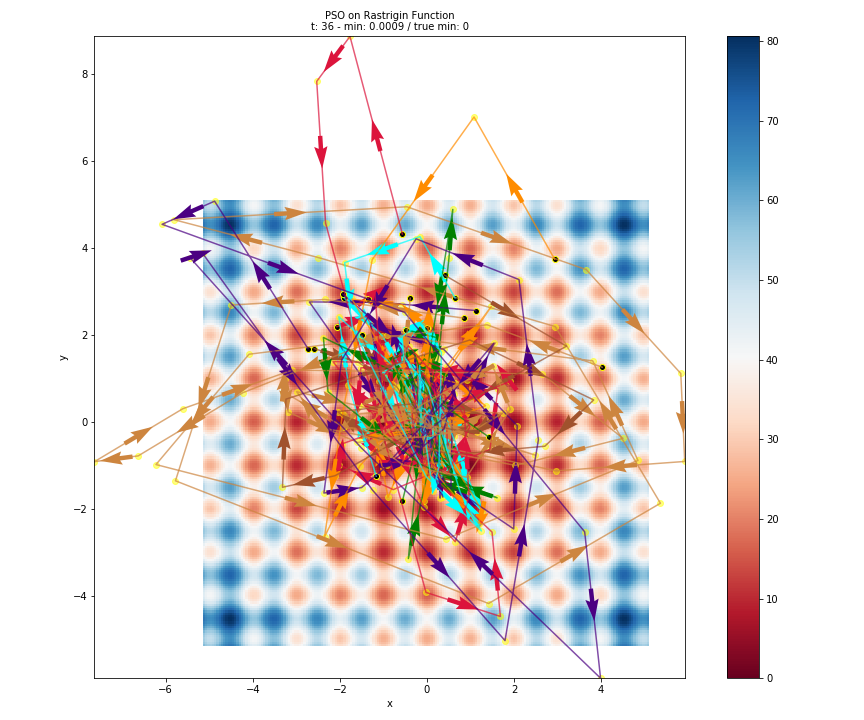

In [15]:
Image(filename=os.path.join(swarm.output_path, "surface.png"))

### Below you can see a gif of the particles moving around your space!

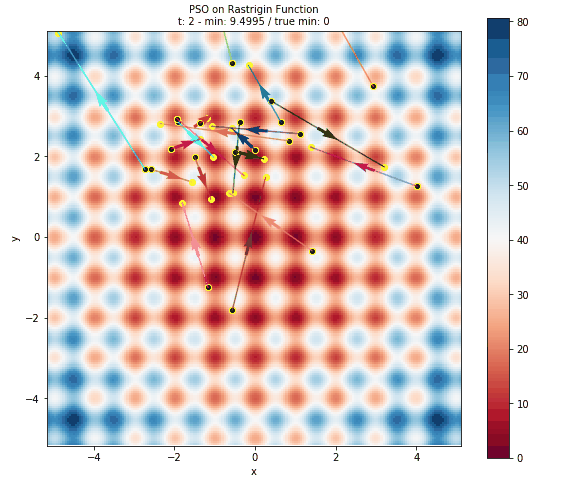

In [16]:
Image(filename=os.path.join(swarm.output_path, "movie.gif"))

In [9]:
""" Cleaning up: deleting the outputs to reduce disk usage """
shutil.rmtree(swarm.output_path, ignore_errors=True)

<a id="spatial-abm">
</a>

## Spatially Explicit ABMs

![Map of influenza cases](img/InfluenzaCases.png)

Our interest in PSO is for calibrating spatially-explicit agent-based models (ABMs). In particular, we chose a model [of influenza transmission developed by Jeon-Young Kang](https://doi.org/10.1145/3356470.3365531). A notebook for a very similar version of this model (focuses on the Queene Anne neighborhood of Seattle) is [available on CyberGISX as well if you'd like to explore the model more indepth](https://cybergisxhub.cigi.illinois.edu/notebook/a-reproducible-and-replicable-spatially-explicit-agent-based-model-using-cybergis-jupyter-a-case-study-in-queen-anne-neighborhood-seattle-wa/).

Calibrating spatially-explicit ABMs often depend on the concept of [pattern-oriented validation](https://search.proquest.com/openview/9b2d012f5aa1a575a945ddf0f364e11b/1?pq-origsite=gscholar&cbl=18750&diss=y). Pattern-Oriented Validation is based on Pattern-Oriented Modeling (POM) which seeks to replicate observed patterns using simulation. In the case of the influenza model, the pattern is the curve describing the number of cases over a flu season and we calibrate by getting the simulated curve as close as possible to this line (measured by RMSE). For our model, we were able to obtain influenza case data from the Florida Department of Health.

![Influenza cases over time](img/InfectionCases.png)

**NOTE: The spatially explicit ABM can take 30-120 minutes per run meaning that a single generation with 20 particles can take 10-40 hours *per generation*. It is not recommended to do this on here, but rather on cyberinfrastructure with a large number of threads to speed this up.**

In [10]:
abm_generations_slider = ipywidgets.IntSlider(
    value=36,
    min=1,
    max=120,
    step=1,
    description="N Generations"
)
abm_part_slider = ipywidgets.IntSlider(
    value=20,
    min=1,
    max=100,
    step=1,
    description='N Particles'
)
abm_topology_dropdown = ipywidgets.Dropdown(
    options=[ "fullyconnected", "ring", "vonNeumann" ],
    description="Topology"
)
display(abm_generations_slider,abm_part_slider,abm_topology_dropdown)

Dropdown(description='Cost Func', options=(('eggholder', <function eggholder at 0x7f7453453050>), ('michal', <…

IntSlider(value=36, description='N Generations', max=120, min=1)

IntSlider(value=20, description='N Particles', min=1)

Dropdown(description='Topology', options=('fullyconnected', 'ring', 'vonNeumann'), value='fullyconnected')

In [11]:
args = {
    "gif" : "False",
    "max_velocity" : "inf",
    "particles" : abm_part_slider.value,
    "threads" : 1,
    "topology" : amb_topology_dropdown.value,
    "max_iterations" : abm_generation_dropdown.value
    "function": {
        "city" : "Miami",
        "days" : 154,
        "metric" : "rmse",
        "dim_description" : ["introRate","reproduction","infRate"],
        "function" : "kang_simple"
    }
}


pprint(args)
swarm = PSO(func_dropdown.value, get_bounds(func_dropdown.value,2), args)

print("\nThe results can found at the run's output director: {}".format(swarm.output_path))
print("\nThe log for the run can be found at {}. Here is small preview:".format(swarm.log_file))
with open(swarm.log_file) as myfile:
    for i in range(3):
        print(next(myfile))

{
    "function": {
        "dim_description": "None",
        "dimension": 2,
        "function": "eggholder"
    },
    "gif": "True",
    "max_iterations": 48,
    "max_velocity": "inf",
    "particles": 20,
    "threads": 1,
    "topology": "fullyconnected"
}
|-----+-------------------+-----------------------------------------
| Gen | Global Best Error | Global Best Pos 
|-----+-------------------+-----------------------------------------
| 0   | inf               | [] 
| 1   |       -688.736016 | [-431.87010333463184, -366.7987919790378] 
| 2   |       -696.255241 | [-432.3828433582236, -366.17076511580103] 
| 3   |       -720.317908 | [-464.0077157967472, -377.53861120558] 
| 4   |       -760.461687 | [-448.2000973652497, -380.9737068924228] 
| 5   |       -760.461687 | [-448.2000973652497, -380.9737068924228] 
| 6   |       -771.952534 | [-466.8268781640784, -389.78305166201767] 
| 7   |       -771.952534 | [-466.8268781640784, -389.78305166201767] 
| 8   |       -771.952534 | [

Process ForkPoolWorker-2:
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
  File "/opt/conda/lib/python3.7/multiprocessing/process.py", line 99, in run
    self._target(*self._args, **self._kwargs)
  File "/opt/conda/lib/python3.7/multiprocessing/pool.py", line 110, in worker
    task = get()
  File "/opt/conda/lib/python3.7/multiprocessing/queues.py", line 352, in get
    res = self._reader.recv_bytes()
  File "/opt/conda/lib/python3.7/multiprocessing/connection.py", line 216, in recv_bytes
    buf = self._recv_bytes(maxlength)
  File "/opt/conda/lib/python3.7/multiprocessing/connection.py", line 407, in _recv_bytes
    buf = self._recv(4)
  File "/opt/conda/lib/python3.7/multiprocessing/connection.py", line 379, in _recv
    chunk = read(handle, remaining)
KeyboardInterrupt


| 11  |       -784.895731 | [-460.23025298866565, -385.373822397032] 


KeyboardInterrupt: 

Process ForkPoolWorker-4:
Process ForkPoolWorker-3:
Traceback (most recent call last):
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
  File "/opt/conda/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
  File "/opt/conda/lib/python3.7/multiprocessing/process.py", line 99, in run
    self._target(*self._args, **self._kwargs)
  File "/opt/conda/lib/python3.7/multiprocessing/process.py", line 99, in run
    self._target(*self._args, **self._kwargs)
  File "/opt/conda/lib/python3.7/multiprocessing/pool.py", line 110, in worker
    task = get()
  File "/opt/conda/lib/python3.7/multiprocessing/pool.py", line 110, in worker
    task = get()
  File "/opt/conda/lib/python3.7/multiprocessing/queues.py", line 352, in get
    res = self._reader.recv_bytes()
  File "/opt/conda/lib/python3.7/multiprocessing/queues.py", line 352, in get
    res = self._reader.recv_bytes()
  File "

<a id="learn-more">
</a>

# Learn More!

## PSO

#### Overview / Introductory Papers

* [Defining a Standard for PSO](https://doi.org/10.1109/SIS.2007.368035)
* [Particle swarm optimization](https://doi.org/10.1109/ICNN.1995.488968)
* [Particle swarm optimization: developments, applications and resources](https://doi.org/10.1109/CEC.2001.934374)
* [Particle Swarm Optimization: An Overview](https://doi.org/10.1007/s11721-007-0002-0)

#### Selected Applications

* [A hybrid particle swarm/ant colony algorithm for the classification of hierarchical biological data](https://doi.org/10.1109/SIS.2005.1501608)
* [A particle swarm optimization-based heuristic for scheduling workflow applications in cloud computing environments](https://doi.org/10.1109/AINA.2010.31)
* [Image classification using chaotic particle swarm optimization](https://doi.org/10.1109/ICIP.2006.312968)
* [Particle swarm optimization: basic concepts, variants and applications in power systems](https://doi.org/10.1109/TEVC.2007.896686)
* [Particle swarm optimization in wireless-sensor networks: A brief survey](https://doi.org/10.1109/TSMCC.2010.2054080)

## Calibrating Spatially-Explicit ABM

* [Pattern-Oriented Validation and Sensitivity Analysis Methods for Spatially Explicit Agent-Based Models](https://search.proquest.com/openview/9b2d012f5aa1a575a945ddf0f364e11b/1?pq-origsite=gscholar&cbl=18750&diss=y)
* [Using multiple scale space-time patterns in variance-based global sensitivity analysis for spatially explicit agent-based models](https://doi.org/10.1016/j.compenvurbsys.2019.02.006)
* [Using multiple scale spatio-temporal patterns for validating spatially explicit agent-based models](https://doi.org/10.1080/13658816.2018.1535121)